<a href="https://colab.research.google.com/github/arishp/veltech_genai/blob/main/StableDiffusion_Image_to_Image.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Stable Diffusion - image to image

## Installing the libraries

In [ ]:
!pip install torch==1.13.1 torchvision==0.14.1 torchaudio==0.13.1 torchdata==0.5.1 torchtext==0.14.1

In [ ]:
!pip install -qqq git+https://github.com/huggingface/diffusers.git
!pip install -q accelerate transformers ftfy bitsandbytes==0.35.0 gradio natsort safetensors xformers

## Creating the pipeline

In [43]:
import torch
from diffusers import StableDiffusionImg2ImgPipeline

device = "cuda"
pipe = StableDiffusionImg2ImgPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16)
pipe = pipe.to(device)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [44]:
pipe.enable_attention_slicing()
pipe.enable_xformers_memory_efficient_attention()

In [45]:
seed = 777

## Loading the initial image


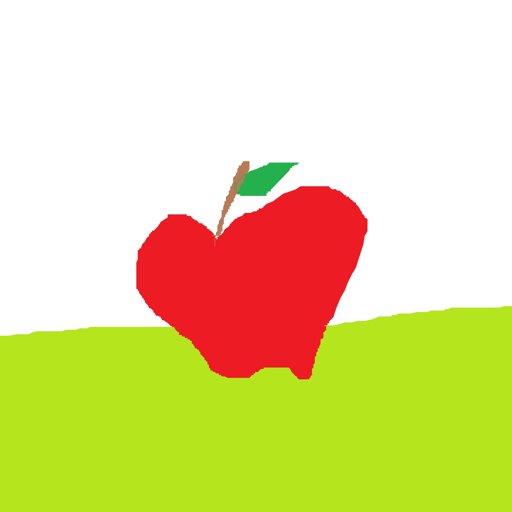

In [46]:
from PIL import Image
init_img = Image.open('/content/apple.jpg').convert("RGB")
init_img = init_img.resize((512, 512))
init_img

## Creating the prompt

In [47]:
prompt = 'photgraph of an apple'

## Generating the image


  0%|          | 0/40 [00:00<?, ?it/s]

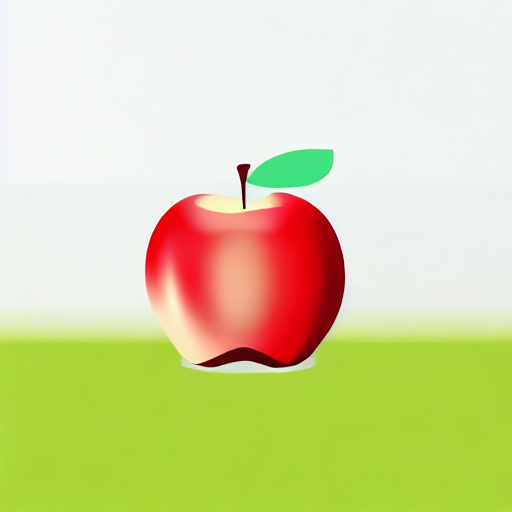

In [48]:
generator = torch.Generator(device = device).manual_seed(seed)
img = pipe(prompt = prompt, image = init_img, generator = generator).images[0]
img

  0%|          | 0/40 [00:00<?, ?it/s]

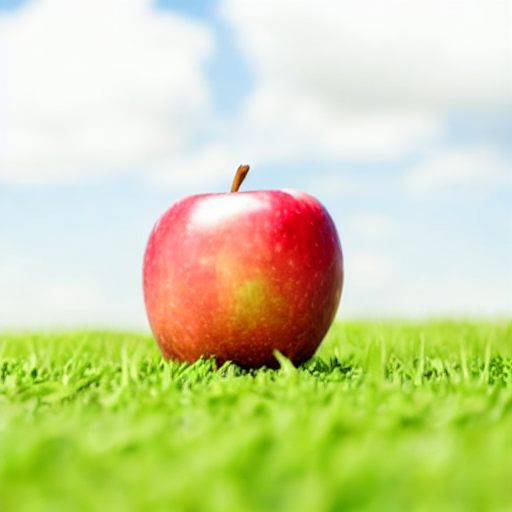

In [49]:
prompt = "photograph of an apple on a grass field, blue sky and clouds in the background"
generator = torch.Generator(device=device).manual_seed(seed)
img = pipe(prompt=prompt, image=init_img, generator=generator).images[0]
img

  0%|          | 0/40 [00:00<?, ?it/s]

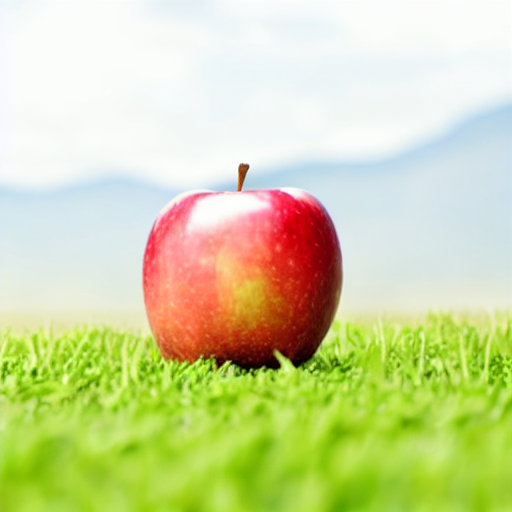

In [50]:
prompt = "photograph of an apple on a grass field, mountains in the background"
generator = torch.Generator(device=device).manual_seed(seed)
img = pipe(prompt=prompt, image=init_img, generator=generator).images[0]
img

## Strength parameter (intensity)

* The initial image will be used as a starting point.
* Value between 0.0 and 1.0 that controls the amount of noise added to the input image. Values close to 1 allow many variations, but will also produce images that are not so similar to the input image.
* The smaller the value, the closer to the input image it will be. The higher, the more freedom the AI will have to generate the image (more noise will be added).
* Default value is 0.8
* If strength = 1, the input image is ignored.

  0%|          | 0/42 [00:00<?, ?it/s]

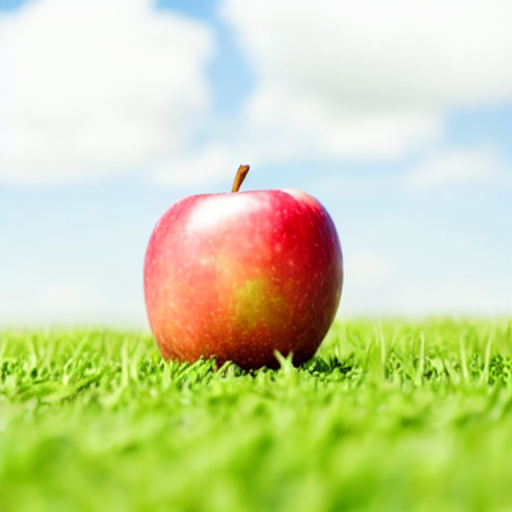

In [52]:
prompt = "photograph of an apple on a grass field, blue sky and clouds in the background"
generator = torch.Generator(device=device).manual_seed(seed)
img = pipe(prompt = prompt, image=init_img, strength=0.85, generator=generator).images[0]
img

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

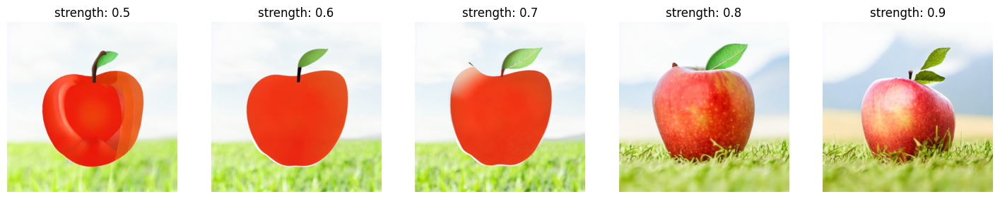

In [ ]:
import matplotlib.pyplot as plt
prompt = "photograph of an apple on a grass field, mountains in the background"
plt.figure(figsize=(18,8))
for i in range(1, 6):

  strength_val = (i + 4) / 10
  generator = torch.Generator("cuda").manual_seed(seed)
  img = pipe(prompt, image=init_img, strength=strength_val, generator=generator).images[0]

  plt.subplot(1,5,i)
  plt.title('strength: {}'.format(strength_val))
  plt.imshow(img)
  plt.axis('off')

plt.show()

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

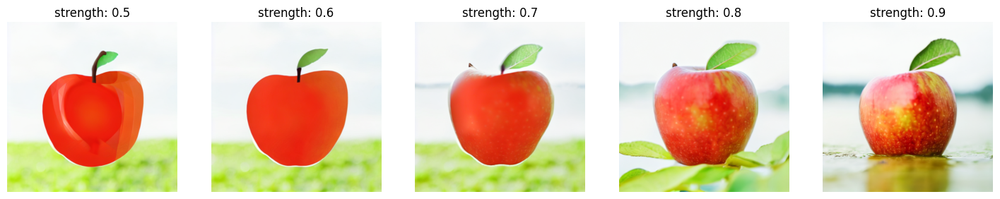

In [ ]:
import matplotlib.pyplot as plt

prompt = "photograph of an apple on a river"

plt.figure(figsize=(18,8))
for i in range(1, 6):

  strength_val = (i + 4) / 10
  generator = torch.Generator("cuda").manual_seed(seed)
  img = pipe(prompt, image=init_img, strength=strength_val, generator=generator).images[0]

  plt.subplot(1,5,i)
  plt.title('strength: {}'.format(strength_val))
  plt.imshow(img)
  plt.axis('off')

plt.show()

## Testing different styles

  0%|          | 0/40 [00:00<?, ?it/s]

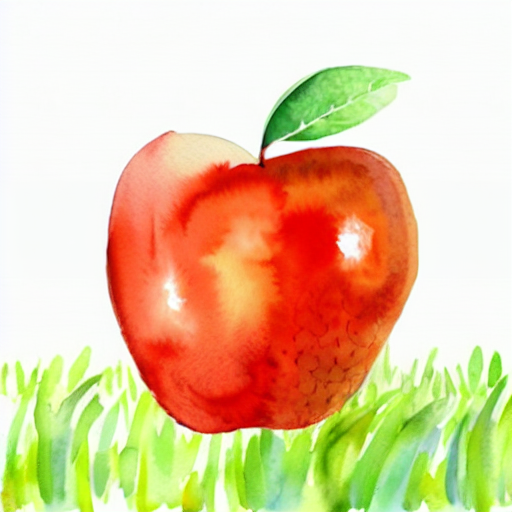

In [ ]:
prompt = "watercolor painting of an apple on a grass field, blue sky and clouds in the background"
generator = torch.Generator(device=device).manual_seed(seed)
image = pipe(prompt=prompt, image=init_img, strength=0.8, generator=generator).images[0]
image

  0%|          | 0/40 [00:00<?, ?it/s]

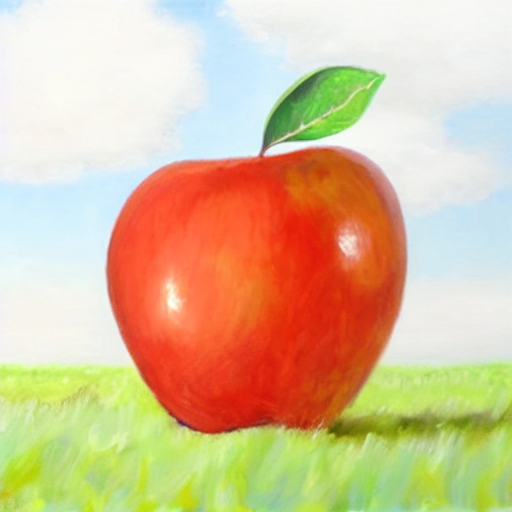

In [ ]:
prompt = "oil painting of an apple on a grass field, blue sky and clouds in the background"
generator = torch.Generator(device=device).manual_seed(seed)
image = pipe(prompt=prompt, image=init_img, strength=0.8, generator=generator).images[0]
image

  0%|          | 0/40 [00:00<?, ?it/s]

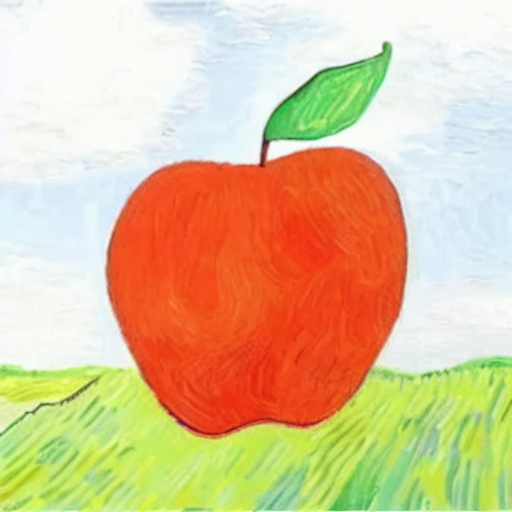

In [ ]:
prompt = "painting of an apple on a grass field, blue sky and clouds in the background, van gogh style"
generator = torch.Generator(device=device).manual_seed(seed)
image = pipe(prompt=prompt, image=init_img, strength=0.8, generator=generator).images[0]
image

## Changing the input image


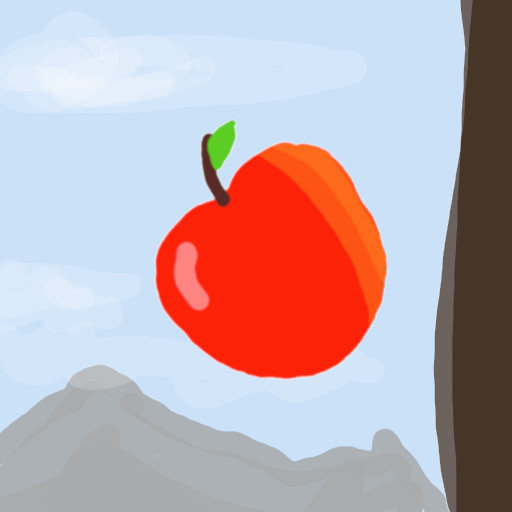

In [ ]:
init_img = Image.open('/content/apple2.jpg')
init_img.thumbnail((512, 512))
init_img

  0%|          | 0/40 [00:00<?, ?it/s]

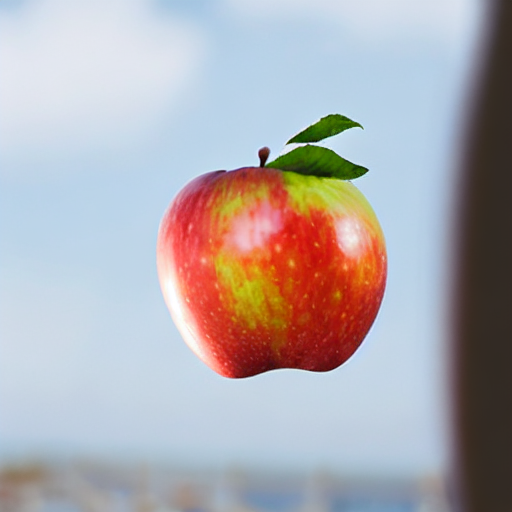

In [ ]:
prompt = "photograph of an apple"
generator = torch.Generator(device=device).manual_seed(seed)
image = pipe(prompt=prompt, image=init_img, strength=0.8, generator=generator).images[0]
image

  0%|          | 0/40 [00:00<?, ?it/s]

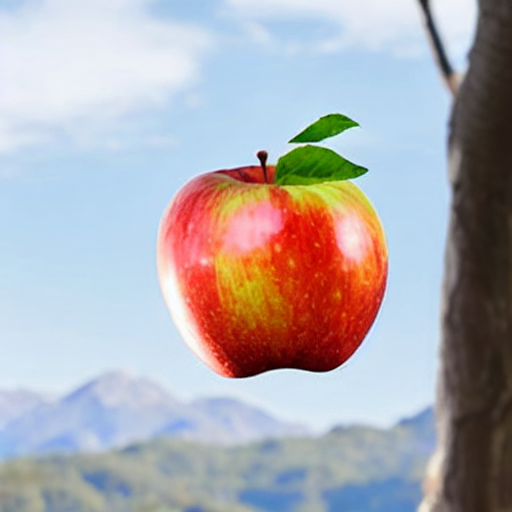

In [ ]:
prompt = "photograph of an apple falling from a tree, mountains in the background"
generator = torch.Generator(device=device).manual_seed(seed)
image = pipe(prompt=prompt, image=init_img, strength=0.8, generator=generator).images[0]
image

  0%|          | 0/40 [00:00<?, ?it/s]

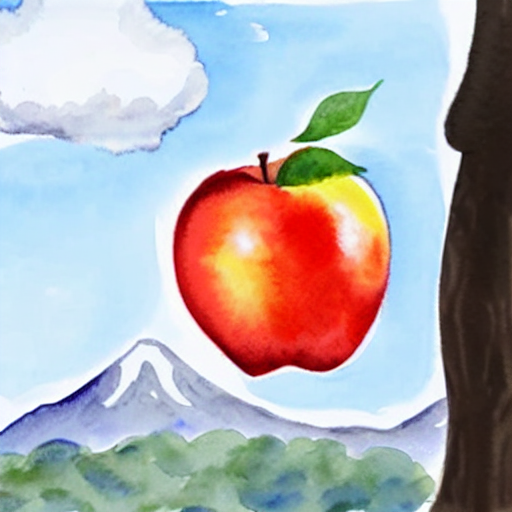

In [ ]:
prompt = "watercolor painting of an apple falling from a tree, mountains in the background"
generator = torch.Generator(device=device).manual_seed(seed)
image = pipe(prompt=prompt, image=init_img, strength=0.8, generator=generator).images[0]
image

## Other models


In [ ]:
modi = StableDiffusionImg2ImgPipeline.from_pretrained("nitrosocke/mo-di-diffusion", torch_dtype=torch.float16)
modi = modi.to("cuda")

safety_checker/model.safetensors not found


Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


  0%|          | 0/37 [00:00<?, ?it/s]

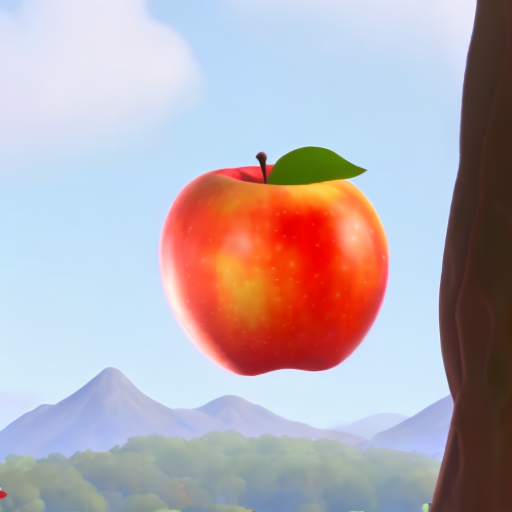

In [ ]:
prompt = "modern disney, an apple falling from a tree, mountains in the background"
generator = torch.Generator(device=device).manual_seed(seed)
image = modi(prompt=prompt, image=init_img, strength=0.75, guidance_scale=7.5, generator=generator).images[0]
image

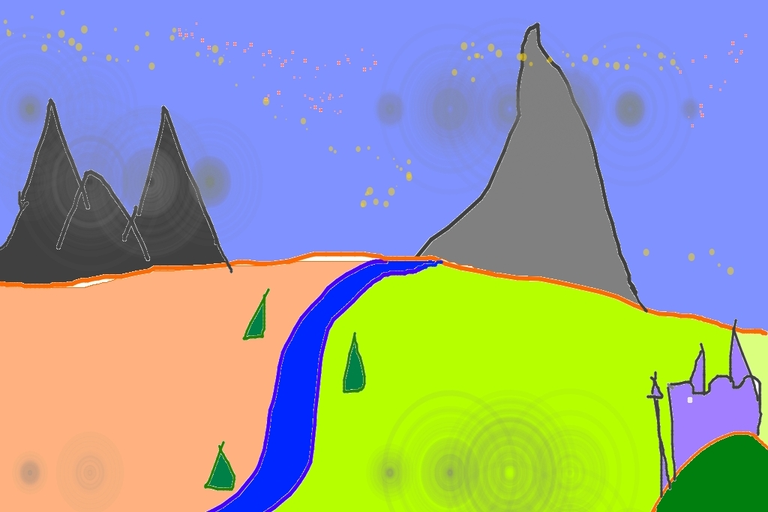

In [55]:
# import requests
# from io import BytesIO
# url = "https://raw.githubusercontent.com/CompVis/stable-diffusion/main/assets/stable-samples/img2img/sketch-mountains-input.jpg"
# response = requests.get(url)
# init_img = Image.open(BytesIO(response.content)).convert("RGB")
# init_img = init_img.resize((768, 512))
# init_img

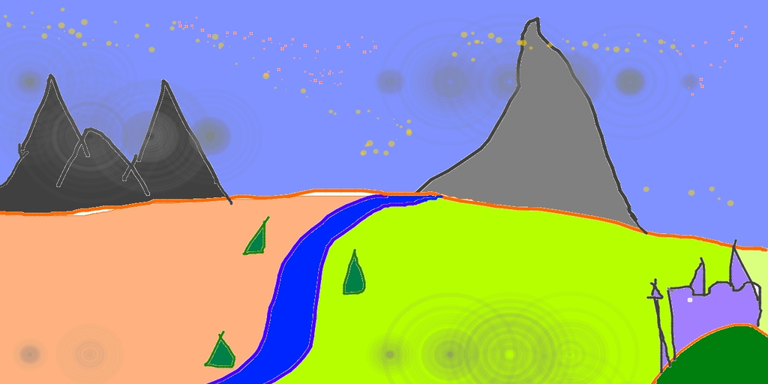

In [ ]:
init_img = Image.open('/content/sketch_mountains.jpg')
init_img.thumbnail((768,768))
init_img

  0%|          | 0/37 [00:00<?, ?it/s]

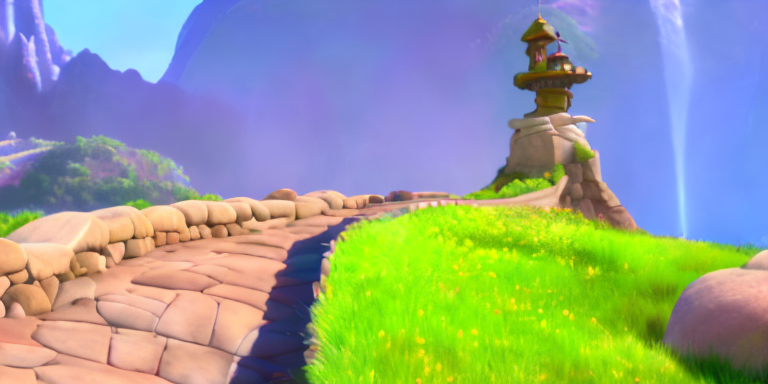

In [ ]:
prompt = "modern disney, a fantasy landscape with mountains"
generator = torch.Generator(device=device).manual_seed(seed)
image = modi(prompt=prompt, image=init_img, strength=0.75, generator=generator).images[0]
image

  0%|          | 0/37 [00:00<?, ?it/s]

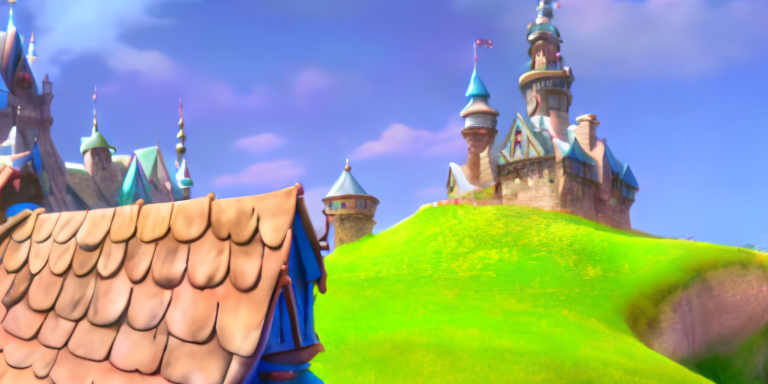

In [ ]:
prompt = "modern disney, a fantasy landscape with castles"
generator = torch.Generator(device=device).manual_seed(seed)
image = modi(prompt=prompt, image=init_img, strength=0.75, guidance_scale=7.5, generator=generator).images[0]
image

> Other seed

  0%|          | 0/37 [00:00<?, ?it/s]

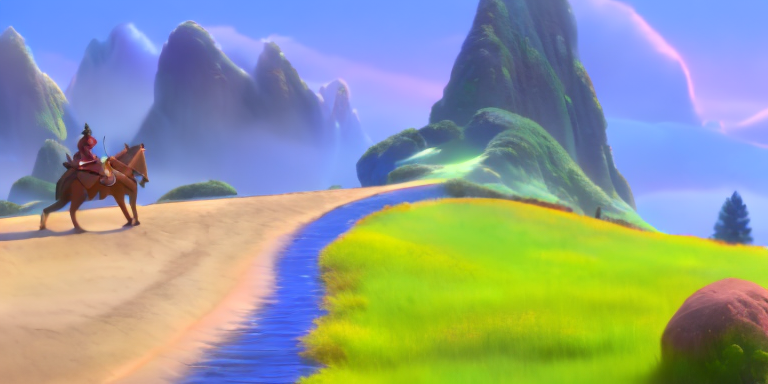

In [ ]:
prompt = "modern disney, a fantasy landscape with mountains"

generator = torch.Generator(device=device).manual_seed(1024)
image = modi(prompt=prompt, image=init_img, strength=0.75, guidance_scale=7.5, generator=generator).images[0]
image

  0%|          | 0/37 [00:00<?, ?it/s]

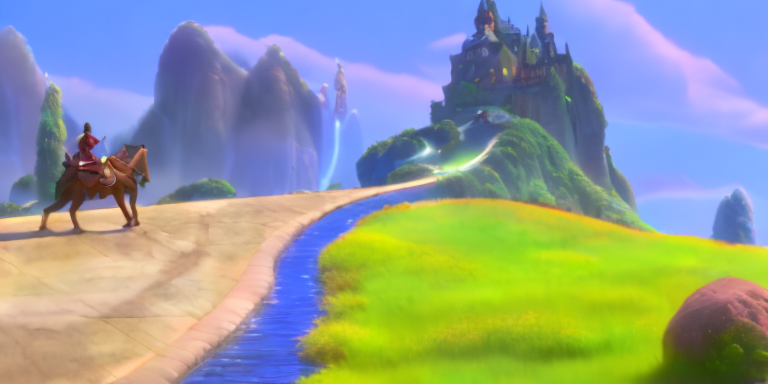

In [ ]:
prompt = "modern disney, a fantasy landscape with castles"

generator = torch.Generator(device=device).manual_seed(1024)
image = modi(prompt=prompt, image=init_img, strength=0.75, guidance_scale=7.5, generator=generator).images[0]
image

> Other model



In [ ]:
gd = StableDiffusionImg2ImgPipeline.from_pretrained("nitrosocke/Ghibli-Diffusion", torch_dtype=torch.float16)
gd = gd.to("cuda")

safety_checker/model.safetensors not found


Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


  0%|          | 0/37 [00:00<?, ?it/s]

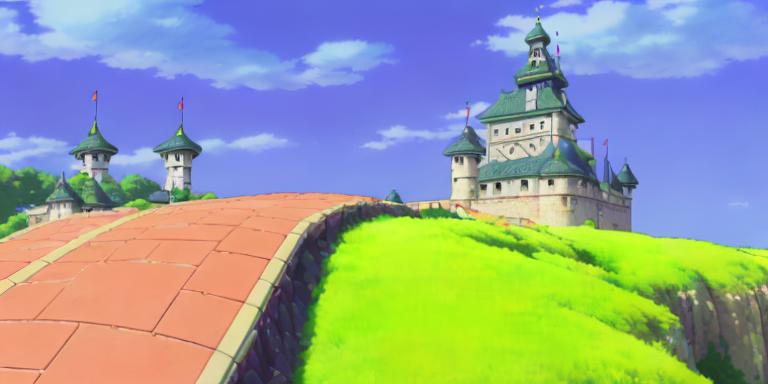

In [ ]:
prompt = "ghibli style, a fantasy landscape with castles"

generator = torch.Generator(device=device).manual_seed(seed)
image = gd(prompt=prompt, image=init_img, strength=0.75, guidance_scale=7.5, generator=generator).images[0]
image

## Changing the scheduler

In [ ]:
from diffusers import EulerAncestralDiscreteScheduler

gd.scheduler = EulerAncestralDiscreteScheduler.from_config(gd.scheduler.config)

  0%|          | 0/37 [00:00<?, ?it/s]

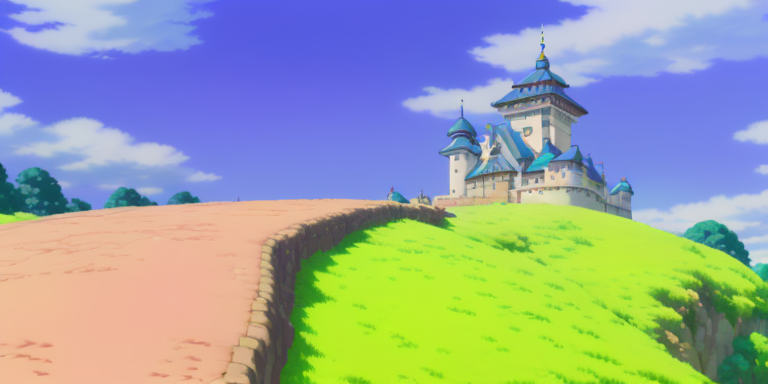

In [ ]:
prompt = "ghibli style, a beautiful landscape with mountains and castles"
generator = torch.Generator(device=device).manual_seed(seed)
img = gd(prompt=prompt, image=init_img, strength=0.75, guidance_scale=7.5, generator=generator).images[0]
img

## Image to image "editing" (InstructPix2pix)

**InstructPix2Pix** was presented in the paper: *InstructPix2Pix: Learning to Follow Image Editing Instructions* (https://arxiv.org/abs/2211.09800)

> Website and more examples: https://www.timothybrooks.com/instruct-pix2pix/



In [ ]:
from diffusers import StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler

instruct = StableDiffusionInstructPix2PixPipeline.from_pretrained("timbrooks/instruct-pix2pix", torch_dtype=torch.float16, safety_checker=None)

instruct.to("cuda")
instruct.scheduler = EulerAncestralDiscreteScheduler.from_config(instruct.scheduler.config)

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

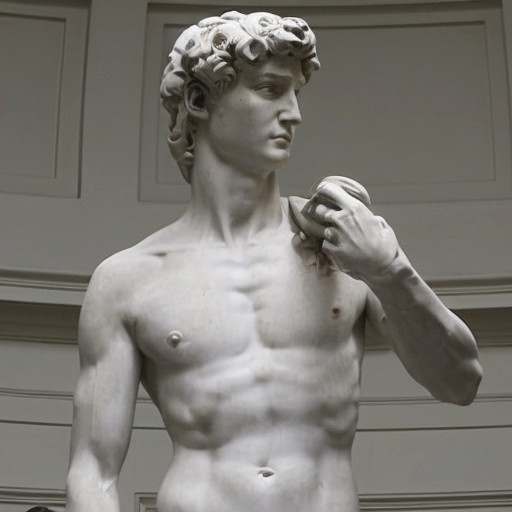

In [ ]:
init_img = Image.open("michelangelo.jpg")
init_img.thumbnail((512, 512))
init_img

  0%|          | 0/20 [00:00<?, ?it/s]

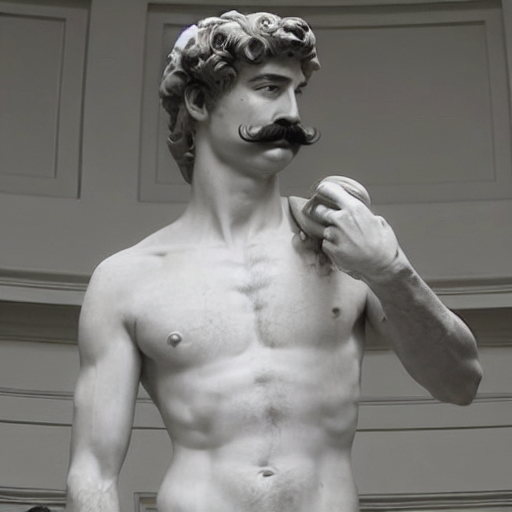

In [ ]:
prompt = 'give him a moustache'
seed = 777
generator = torch.Generator(device=device).manual_seed(seed)
result_img = instruct(prompt, image=init_img, num_inference_steps=20, image_guidance_scale=1, generator=generator).images[0]
result_img

  0%|          | 0/20 [00:00<?, ?it/s]

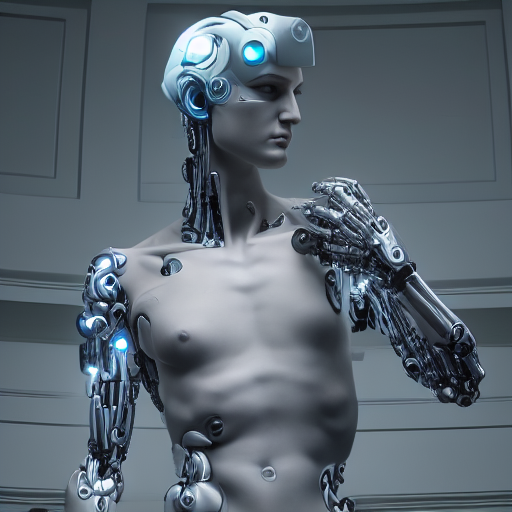

In [ ]:
prompt = "turn into a cyborg"
generator = torch.Generator(device=device).manual_seed(seed)
result_img = instruct(prompt, image=init_img, num_inference_steps=20, image_guidance_scale=1, generator=generator).images[0]
result_img

  0%|          | 0/20 [00:00<?, ?it/s]

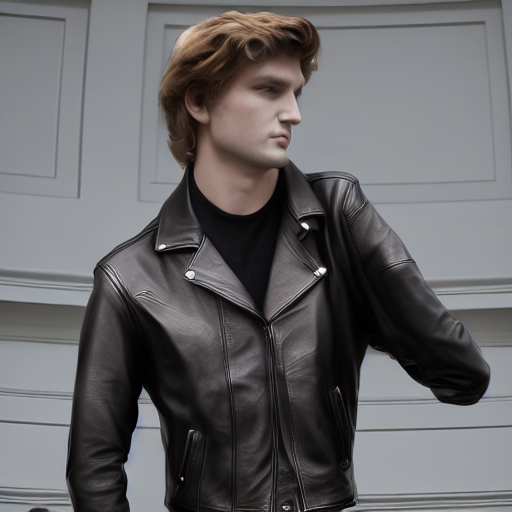

In [ ]:
prompt = "make him wear a leather jacket"
generator = torch.Generator(device=device).manual_seed(seed)
result_img = instruct(prompt, image=init_img, num_inference_steps=20, image_guidance_scale=1, generator=generator).images[0]
result_img

  0%|          | 0/20 [00:00<?, ?it/s]

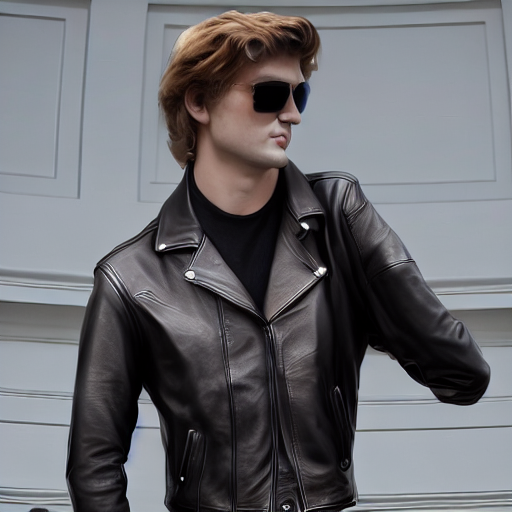

In [ ]:
prompt = "add sun glasses"
generator = torch.Generator(device=device).manual_seed(seed)
result_img = instruct(prompt, image=result_img, num_inference_steps=20, image_guidance_scale=1, generator=generator).images[0]
result_img

  0%|          | 0/15 [00:00<?, ?it/s]

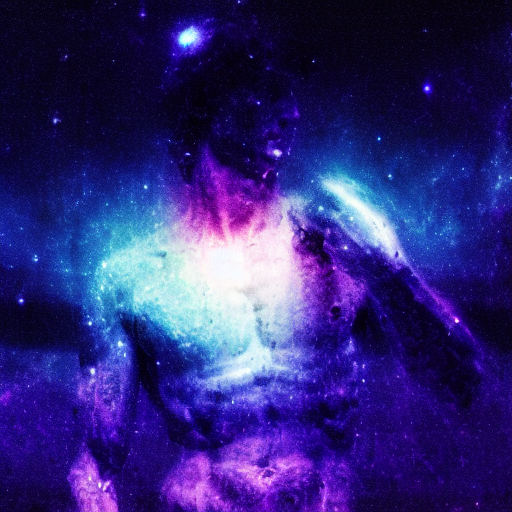

In [ ]:
prompt = "turn into a galaxy"
generator = torch.Generator(device=device).manual_seed(seed)
result_img = instruct(prompt, image=init_img, num_inference_steps=15, image_guidance_scale=1.2, generator=generator).images[0]
result_img

> Other image

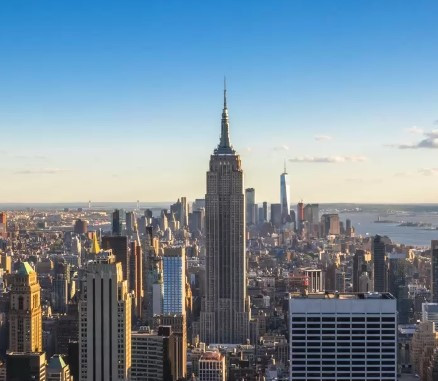

In [ ]:
init_img = Image.open("empire-state.jpg")
init_img

  0%|          | 0/10 [00:00<?, ?it/s]

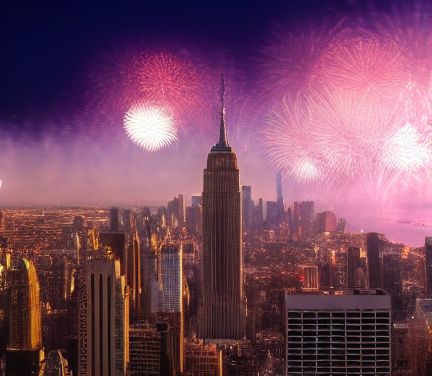

In [ ]:
prompt = "add fireworks in the sky"
generator = torch.Generator(device=device).manual_seed(seed)
result_img = instruct(prompt, image=init_img, num_inference_steps=10, image_guidance_scale=1, generator=generator).images[0]
result_img

  0%|          | 0/20 [00:00<?, ?it/s]

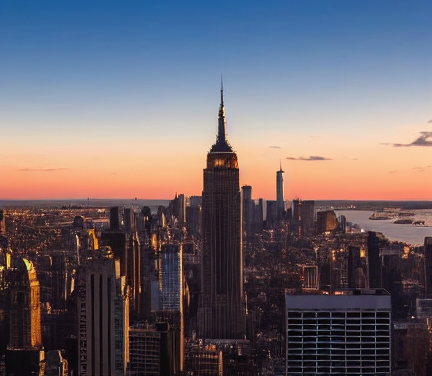

In [ ]:
prompt = "make it evening"
generator = torch.Generator(device=device).manual_seed(seed)
result_img = instruct(prompt, image=init_img, num_inference_steps=20, image_guidance_scale=1, generator=generator).images[0]
result_img

  0%|          | 0/10 [00:00<?, ?it/s]

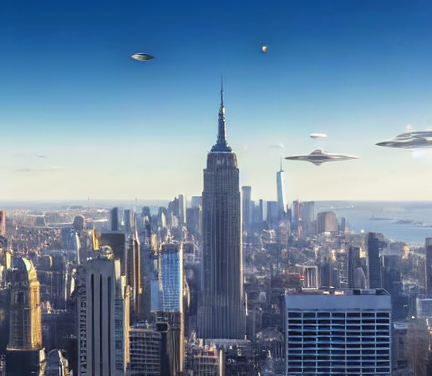

In [ ]:
prompt = "add spaceships in the sky"
generator = torch.Generator(device=device).manual_seed(seed)
result_img = instruct(prompt, image=init_img, num_inference_steps=10, image_guidance_scale=1.3, generator=generator).images[0]
result_img

  0%|          | 0/10 [00:00<?, ?it/s]

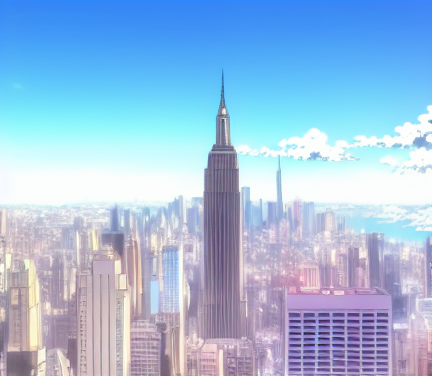

In [ ]:
prompt = "turn it into an anime"
generator = torch.Generator(device=device).manual_seed(seed)
result_img = instruct(prompt, image=init_img, num_inference_steps=10, image_guidance_scale=1, generator=generator).images[0]
result_img

  0%|          | 0/20 [00:00<?, ?it/s]

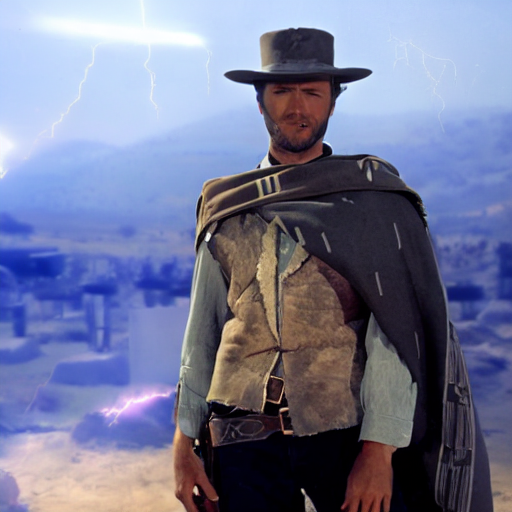

In [ ]:
init_img = Image.open("clint-eastwood.jpg")
init_img.thumbnail((512, 512))
init_img

prompt = "add lightnings in the sky"
generator = torch.Generator(device=device).manual_seed(seed)
result_img = instruct(prompt, image=init_img, num_inference_steps=20, image_guidance_scale=1.5, generator=generator).images[0]
result_img

More ideas:
* "give him a moustache",
* "add sun glasses",
* "make it evening",
* "turn into a 3d model",
* "add lightnings"
* "move it to mars",
* "add fireworks in the sky",
* "add spaceships in the sky",
* "make it futuristic",
* "make it a claymotion",
* "turn it into a galaxy",
* "turn it into lego"

More:

* Change the Style to (name of the artist or style)
* Have her/him (doing something)
* Make her/him look like (object or people)
* Turn the (object) into a (object)
* Add a (object)
* Add a (object) on (somewhere in the image)
* Replace the (object) with (object)
* Put them in (scenario)
* Apply (emotion or some feature)